## Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

I'll flesh out each step in a section below.

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

I first use the calibration images in the `./camera_cal` folder to compute the camera calibration matrix `mtx` and distortion coefficients `dist`.

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

def calibrate_camera():
    # Numbers of inside corners.
    nx = 9
    ny = 6

    # Make a list of calibration images
    images = glob.glob('./camera_cal/calibration*.jpg')

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane

    # Prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0), ..., (9, 6, 0).
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # Step through the list and search for chessboard corners.
    for i, fname in enumerate(images):
        img = plt.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, add object points, image points.
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

    return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

_, mtx, dist, _, _ = calibrate_camera()

## 2. Apply a distortion correction to raw images.

Next, I use the calibration matrix and distortion coefficients to undistort some images.

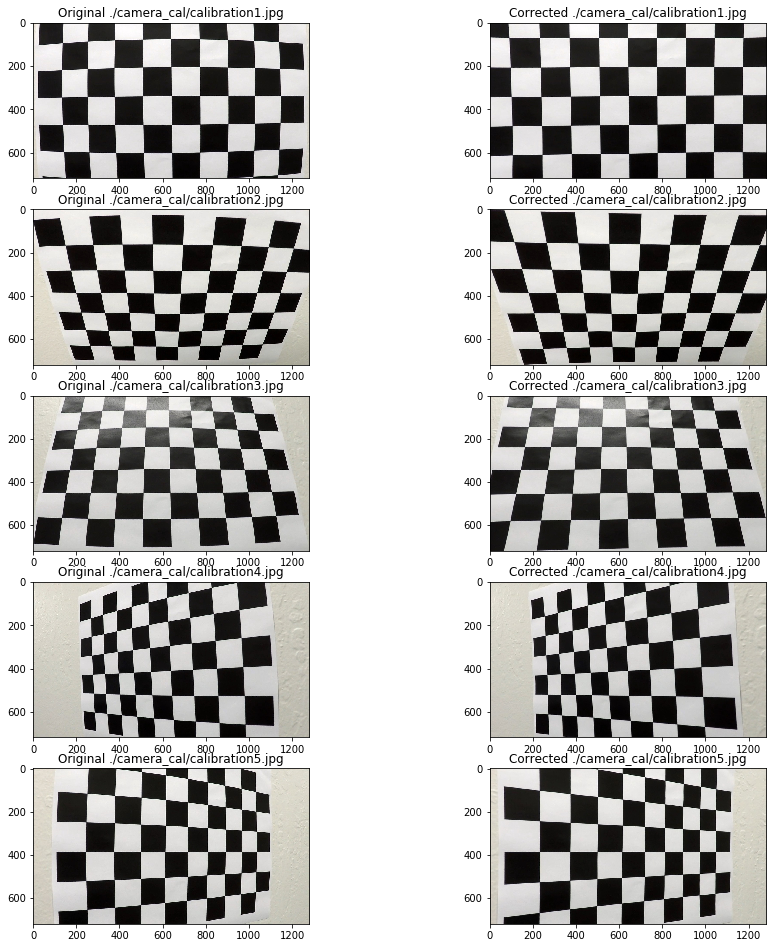

In [2]:
def apply_distortion_correction(mtx, dist, img):
    return cv2.undistort(img, mtx, dist, None, mtx)

plt.figure(figsize=(15, 20))
for i in range(1, 6):
    path = './camera_cal/calibration{}.jpg'.format(i)
    fname = path.split('/')[-1]

    # Show original image.
    plt.subplot(6, 2, i * 2 - 1).set_title('Original ' + path)
    img = cv2.imread(path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Show distortion-corrected image.
    plt.subplot(6, 2, i * 2).set_title('Corrected ' + path)
    dst = apply_distortion_correction(mtx, dist, img)
    cv2.imwrite('./output_images/camera_cal/{}'.format(fname), dst)
    plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

`./camera_cal/calibration1.jpg` thru `./camera_cal/calibration5.jpg` are close-ups of the chess board and have the most pronounced distortion. The corrected images do look like they've been undistorted; the straight lines in the chess board have been restored!

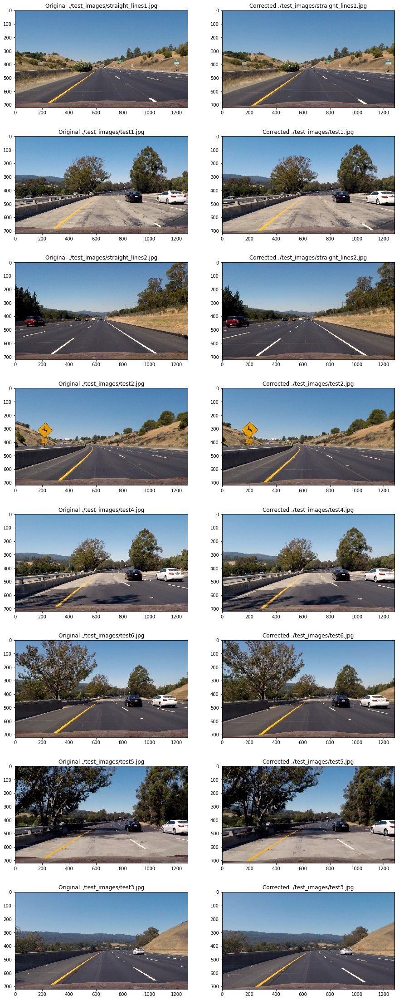

In [3]:
test_images = glob.glob('./test_images/*.jpg')

plt.figure(figsize=(15, 40))
for i, path in enumerate(test_images):
    fname = path.split('/')[-1]

    # Show original image.
    plt.subplot(len(test_images), 2, i * 2 + 1).set_title('Original ' + path)
    img = cv2.imread(path)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    # Show distortion-corrected image.
    plt.subplot(len(test_images), 2, i * 2 + 2).set_title('Corrected ' + path)
    dst = apply_distortion_correction(mtx, dist, img)
    cv2.imwrite('./output_images/undistort/{}'.format(fname), dst)
    plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))

## 3. Use color transforms, gradients, etc., to create a thresholded binary image.

Next I turn my attention to identifing likely lane line pixels in road images, using gradients and color thresholding.

First, I use gradients to try to detect the boundaries of lane lines.

In [4]:
# Based on "Project: Advanced Lane Finding, 24. Combining Thresholds".

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Calculate the absolute value of the directional gradient.
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if orient == 'x':
        grad = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        grad = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_grad = np.absolute(grad)
    scaled = np.uint8(255 * abs_grad / np.max(abs_grad))

    # Apply threshold
    grad_binary = np.zeros_like(scaled)
    grad_binary[(scaled > thresh[0]) & (scaled < thresh[1])] = 1
    return grad_binary

def mag_thresh(image, sobel_kernel=3, thresh=(0, 255)):
    # Calculate the gradient magnitude.
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gradx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    grady = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    mag = np.sqrt(np.square(gradx) + np.square(grady))
    scaled = np.uint8(255 * mag / np.max(mag))

    # Apply threshold
    mag_binary = np.zeros_like(scaled)
    mag_binary[(scaled > thresh[0]) & (scaled < thresh[1])] = 1
    return mag_binary

def dir_thresh(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Calculate the gradient direction.
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gradx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    grady = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_gradx = np.absolute(gradx)
    abs_grady = np.absolute(grady)
    dir = np.arctan(abs_grady, abs_gradx)

    # Apply threshold
    dir_binary = np.zeros_like(gray)
    dir_binary[(dir > thresh[0]) & (dir < thresh[1])] = 1
    return dir_binary

# Combine gradient-based thresholding functions.
# `undist_image` is expected to be a distortion-corrected image.
def apply_gradient_thresholds(undist_image):
    # Choose a Sobel kernel size.
    ksize = 5 # Choose a larger odd number to smooth gradient measurements.
    
    # Choose individual thresholds.
    gradx = abs_sobel_thresh(undist_image, orient='x', sobel_kernel=ksize, thresh=(20, 255))
    grady = abs_sobel_thresh(undist_image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
    mag_binary = mag_thresh(undist_image, sobel_kernel=ksize, thresh=(60, 255))
    dir_binary = dir_thresh(undist_image, sobel_kernel=ksize, thresh=(1.3, np.pi/2))

    # Combine individual thresholds.
    combined = np.zeros_like(mag_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

Let's see how this choice of thresholds looks.

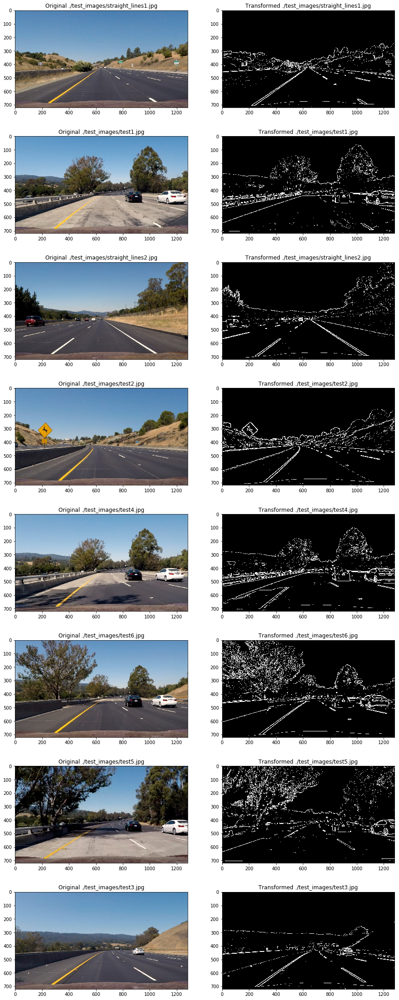

In [5]:
import os

# Applies the given thresholding function `fn` to the images in the `./test_images` folder.
def check_fn_applied_to_undistorted_images(fn, output_dir=None):
    test_images = glob.glob('./test_images/*.jpg')
    plt.figure(figsize=(15, 40))
    for i, path in enumerate(test_images):
        fname = path.split('/')[-1]
        plt.subplot(len(test_images), 2, i * 2 + 1).set_title('Original ' + path)
        img = cv2.imread(path)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        
        plt.subplot(len(test_images), 2, i * 2 + 2).set_title('Transformed ' + path)
        undist = apply_distortion_correction(mtx, dist, img)
        result = fn(undist)
        if output_dir:
            cv2.imwrite(os.path.join(output_dir, fname), result * 255)  # Convert binary to [0, 255] range.
        plt.imshow(result, cmap='gray')

check_fn_applied_to_undistorted_images(apply_gradient_thresholds, output_dir='./output_images/grad_thresh')

Looks pretty good, except for the yellow left lane in `./test_images/test1.jpg`, `./test_images/test4.jpg` and `./test_images/test5.jpg`, which is not necessarily being recognized.

Hopefully adding some color thresholded pixels will help. We want to be able to detect the lane under different lighting conditions, so let's convert the image to HLS color space and utilize the hue and saturation channels (that is, ignore the lightness channel). I'll turn my attention to that next.

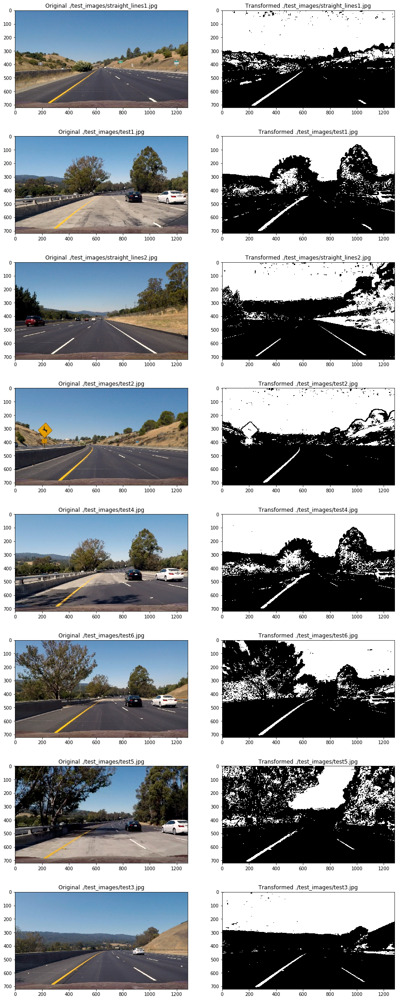

In [6]:
# Based on "Project: Advanced Lane Finding, 29. HLS Quiz".

def hue_threshold(img, thresh=(0, 179)):
    # 1) Convert to HLS color space
    converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    # 2) Apply a threshold to the H channel
    h_channel = converted_img[:, :, 0]
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(h_channel)
    binary_output[(h_channel > thresh[0]) & (h_channel <= thresh[1])] = 1
    return binary_output

def saturation_threshold(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    converted_img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    # 2) Apply a threshold to the S channel
    s_channel = converted_img[:, :, 2]
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# Apply each of the color thresholding functions.
def apply_color_thresholds(undist_image):
    # Choose individual thresholds.
    hue_binary = hue_threshold(undist_image, thresh=(10, 105))
    sat_binary = saturation_threshold(undist_image, thresh=(80, 255))

    # Combine individual thresholds.
    combined = np.zeros_like(sat_binary)
    combined[((hue_binary == 1) & (sat_binary == 1))] = 1
    return combined

check_fn_applied_to_undistorted_images(apply_color_thresholds, output_dir='./output_images/color_thresh')

The yellow left lane in `./test_images/test1.jpg`, `./test_images/test4.jpg`, and `./test_images/test5.jpg` is now clearly visible. The other images still look pretty good, too.

Let's see how the two sets of thresholds look combined.

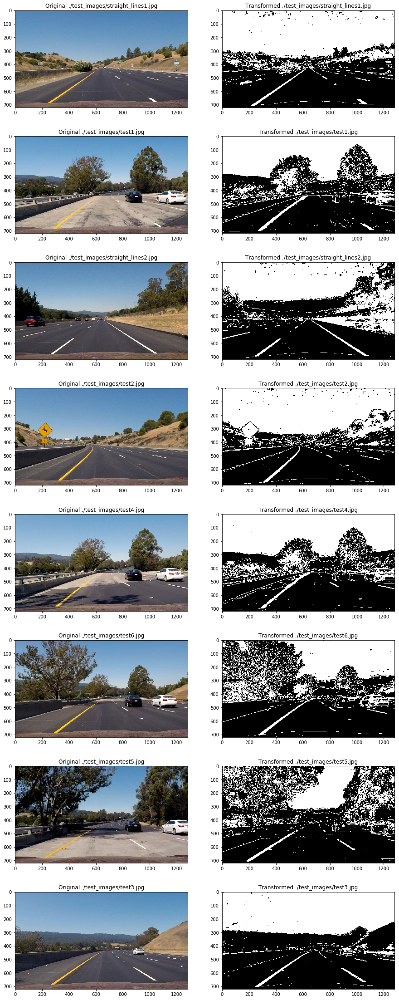

In [7]:
def apply_combined_thresholds(undist_image):
    return apply_gradient_thresholds(undist_image) | apply_color_thresholds(undist_image)

check_fn_applied_to_undistorted_images(apply_combined_thresholds, output_dir='./output_images/combined_thresh')

Both the left and right lane lines are clearly visible, without too much visual noise in the roadway in between them. Great!

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

Now that I have left and right lane lines somewhat selected, it is time to define exactly where the left and right lane lines are and compute their curvature.

As the first step, I apply a perspective transform in order to get a "birds-eye view" of the roadway.

In [8]:
def warp(img, src, dst):
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)
    return warped

To sanity-check this function, I apply it to one of the calibration chess board images.

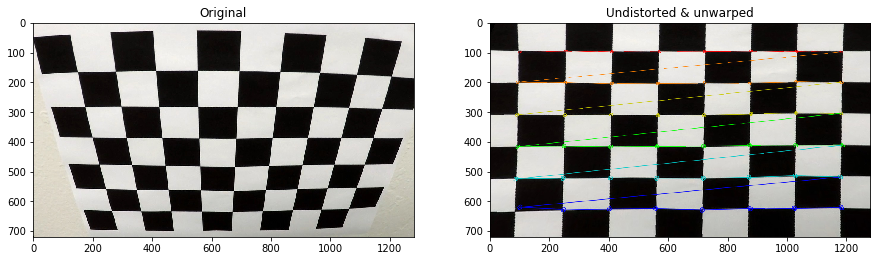

In [9]:
# Based on "Project: Advanced Lane Finding, 17. Undistort and Transform".

def check_warp():
    # Check that the chessboard lines are parallel to the image boundaries.
    nx = 8
    ny = 6

    plt.figure(figsize=(15, 15))
    raw_chess = cv2.imread('./camera_cal/calibration2.jpg')
    
    # Show original image.
    plt.subplot(121).set_title("Original")
    plt.imshow(cv2.cvtColor(raw_chess, cv2.COLOR_BGR2RGB))

    # Show distortion-corrected and perpective-transformed image.
    undist_chess = apply_distortion_correction(mtx, dist, raw_chess)
    undist_chess_gray = cv2.cvtColor(undist_chess, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(undist_chess_gray, (nx, ny), None)
    undist_chess = cv2.drawChessboardCorners(undist_chess, (nx, ny), corners, ret)
    src = np.float32([corners[0], corners[nx - 1], corners[-1], corners[-nx]])
    offset = 100
    dst = np.float32([[offset, offset], [undist_chess.shape[1] - offset, offset],
                      [undist_chess.shape[1] - offset, undist_chess.shape[0] - offset],
                      [offset, undist_chess.shape[0] - offset]])
    warped = warp(undist_chess, src, dst)
    plt.subplot(122).set_title("Undistorted & unwarped")
    cv2.imwrite('./output_images/warped/calibration2.jpg', warped)
    plt.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))

check_warp()

Looks good! The chess board lines are more-or-less parallel to the image boundaries.

Now let's define a new perspective transform for the roadways. I draw a bounding trapezoid arund the lane area (similar to region of interest masking in the original Lane Lines project) and warp it to a rectangular region 200 pixels to the right of the left edge of the image and 400 pixels to the left of the right edge of the image. This is doen to prevent the help the right lane from falling off the edge of the image.

Note that by doing this, I've had to effectively shift the destination rectangle of the perspective transformation 100 pixels to the left. This must be taken into account when computing the position of the car within the lane later on.

In [10]:
# Based on CarND-LaneLines-P1/P1.ipynb.

# Dimensions of roadway images/video frames.
height = 720
width = 1280

# Define a bounding trapezoid.
top_left = [int(0.47 * width), int(0.62 * height)]
top_right = [int(0.53 * width), int(0.62 * height)]
bottom_right = [int(0.85 * width), height]
bottom_left = [int(0.17 * width), height]
vertices = [top_left, top_right, bottom_right, bottom_left]

src = np.float32(vertices)
# We map the source vertices to a destination rectangle that is shifted 100 pixels to the left.
# This helps the right lane line be more visible in the perspective-transformed output, but this
# off-centering must be taken into account when computing the position of the car within the lane.
left_margin = 200
right_margin = 400
dst = np.float32([[left_margin, 0], [width - right_margin, 0], [width - right_margin, height],
                  [left_margin, height]])

def warp_road(img):
    return warp(img, src, dst)

# For use later.
def unwarp_road(img):
    return warp(img, dst, src)

Finally, let's define a pipeline for transforming raw input to perspective-transformed lane line binaries, and sanity-check its output.

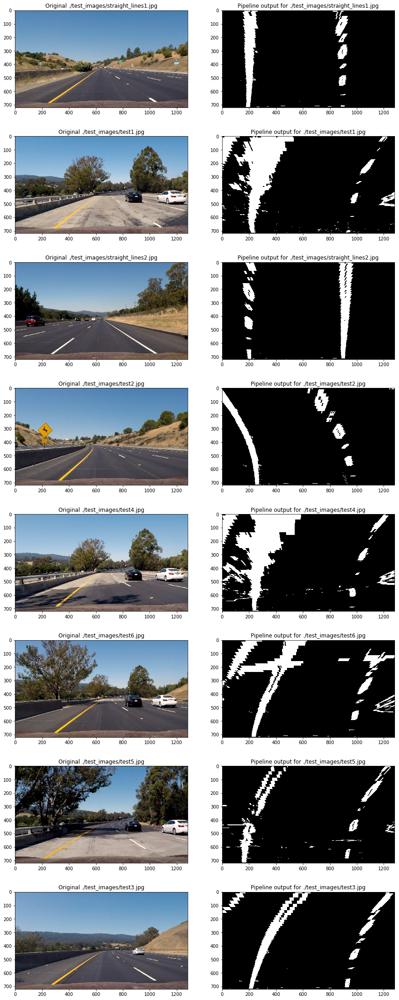

In [11]:
def pipeline(mtx, dist, img):
    undist = apply_distortion_correction(mtx, dist, img)
    thresh_binary = apply_combined_thresholds(undist)
    return warp_road(thresh_binary)

def check_pipeline(mtx, dist):
    test_images = glob.glob('./test_images/*.jpg')
    plt.figure(figsize=(15, 40))
    for i, path in enumerate(test_images):
        fname = path.split('/')[-1]

        # Show original image.
        plt.subplot(len(test_images), 2, i * 2 + 1).set_title('Original ' + path)
        img = cv2.imread(path)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        
        # Show pipeline output.
        plt.subplot(len(test_images), 2, i * 2 + 2).set_title('Pipeline output for ' + path)
        binary_warped = pipeline(mtx, dist, img)
        cv2.imwrite('./output_images/warped/{}'.format(fname), binary_warped * 255)
        plt.imshow(binary_warped, cmap='gray')

check_pipeline(mtx, dist)

Good. `./test_images/straight_lines1.jpg` and `./test_images/straight_lines2.jpg` look parallel, and the curves don't fall off the image boundaries. `./test_images/test1.jpg` and `./test_images/test4.jpg` were two of the images that had trouble with the yellow left lane line. They appear very wide in the binary-thresholded images.

## 5. Detect lane pixels and fit to find the lane boundary.

Now I formally define the left and right lanes by using a sliding window search and fit curves to them. The sliding window search works as follows:

* Find the bottom end of each lane line by taking a histogram of the lower half of the road image and finding the left and right peaks. These will be the x-axis centers of the first windows.
* Define a window height and width (via a margin from the x-axis center).
* Then, looping over the height of the image by window-height:
    * Define windows for the left and right lanes.
    * Add the "good" (nonzero) pixels within the windows to lists of left and right lane pixels (identified by their indexes).
    * If more than a threshold number of "good" pixels appear within a window, reset its x-axis center to the "good" pixels' mean x-value for the next iteration.
* Finally, using the left and right lane pixel lists, color the lanes and fit a 2nd-order polynomial to them.

In [12]:
# Based on "Project: Advanced Lane Lines, 33. Finding the Lanes".

# Expects a warped binary thresholded image as input.
def fit_curves_from_scratch(binary_warped, show_windows=False):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[np.int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped)) * 255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    # Don't search the right `dead_space` pixels for the base of the right lane line.
    dead_space = right_margin - left_margin
    leftx_base = np.argmax(histogram[0:midpoint])
    rightx_base = np.argmax(histogram[midpoint:histogram.shape[0] - dead_space]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window + 1) * window_height
        win_y_high = binary_warped.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        if show_windows:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255 ,0), 2) 
            cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                         (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Color the detected left and right lanes red and blue, respectively.
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit, out_img

Let's see how this function performs on each of the test images.

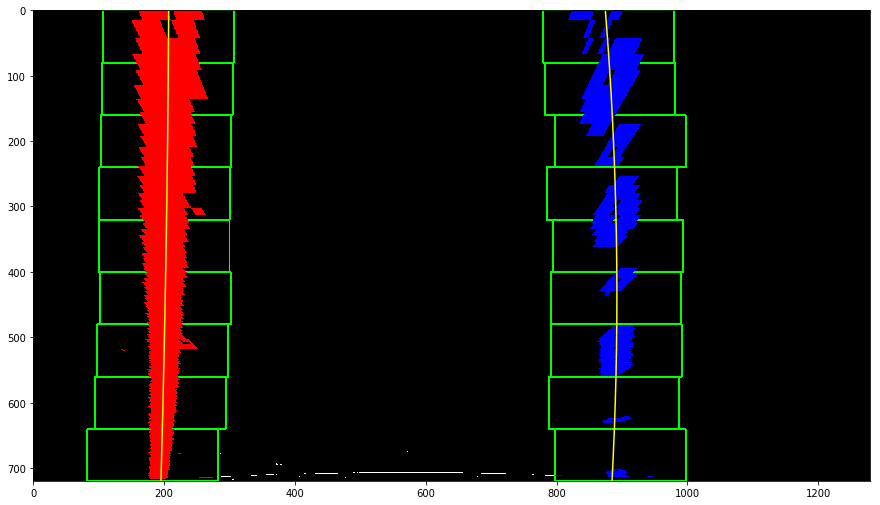

In [13]:
# Based on "Project: Advanced Lane Lines, 33. Finding the Lanes".

def visualize_fit_from_scratch(binary_warped, left_fit, right_fit, out_img):
    # Generate x and y values for the left and right lane line curves, for plotting
    ploty = np.linspace(0, binary_warped.shape[0] - 1, binary_warped.shape[0])
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    # Plot the curves.
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/straight_lines1.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

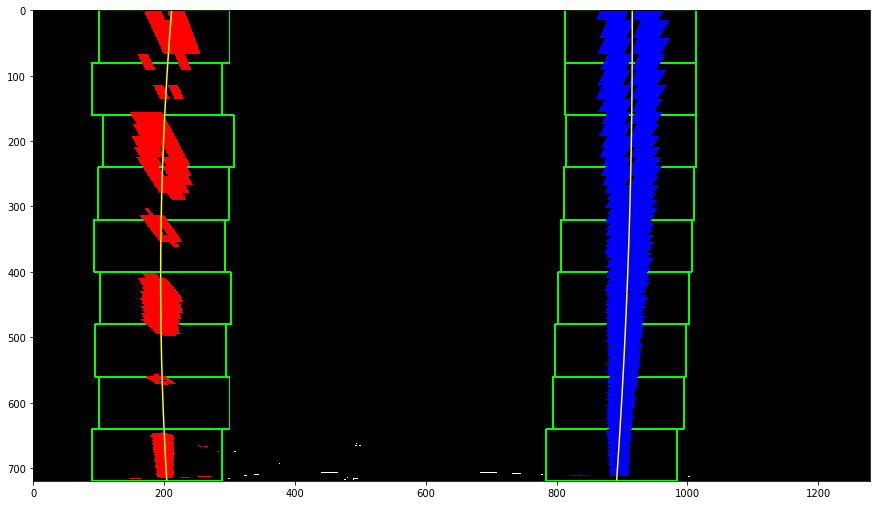

In [14]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/straight_lines2.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

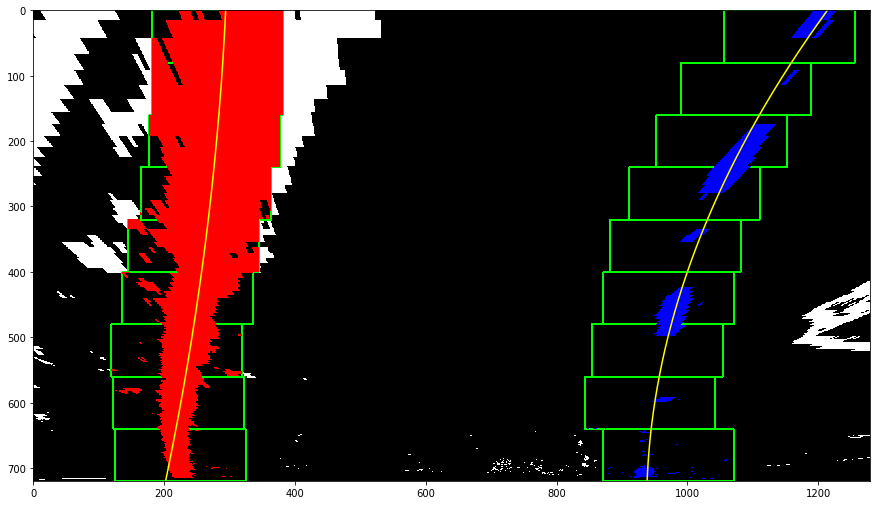

In [15]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/test1.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

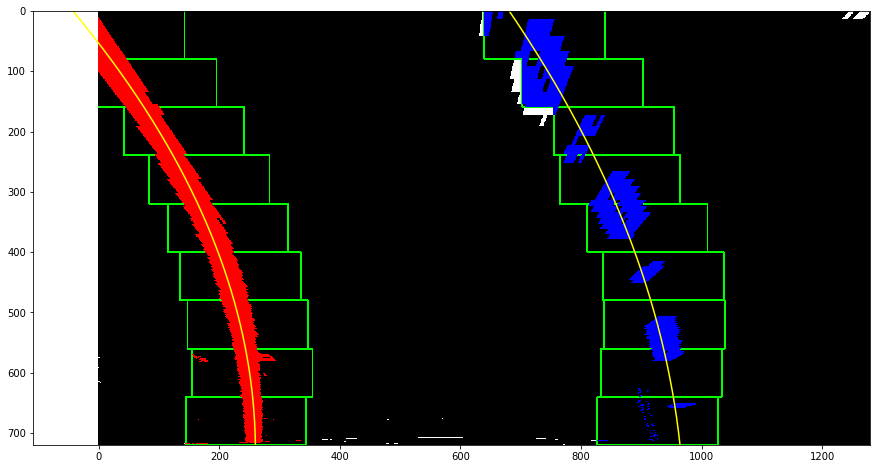

In [16]:
plt.figure(figsize=(15, 15))
img = plt.imread('./test_images/test2.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

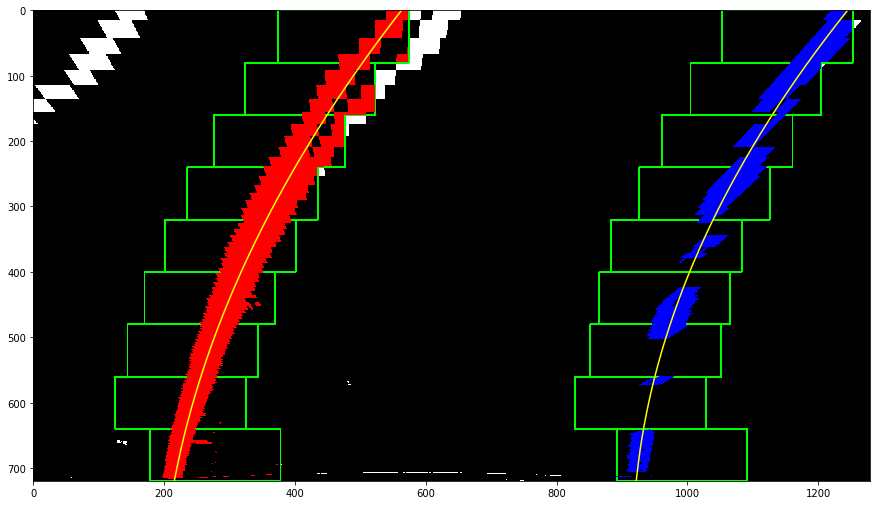

In [17]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/test3.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

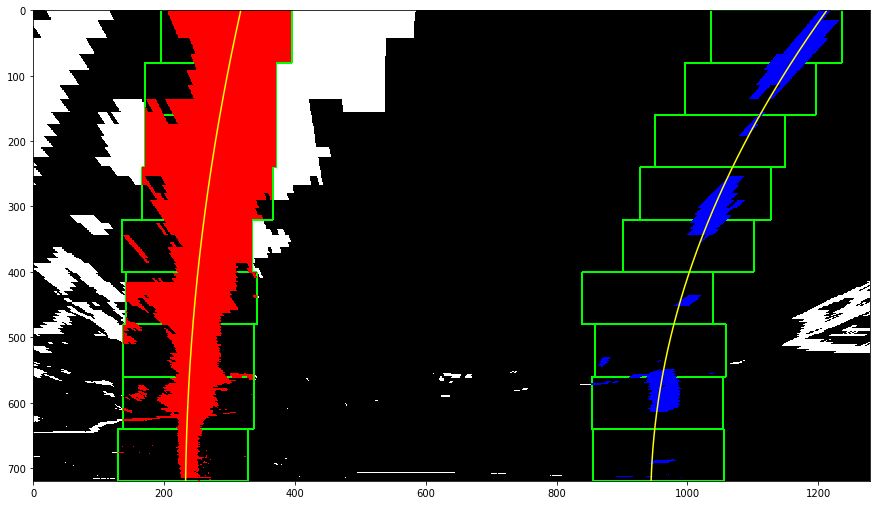

In [18]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/test4.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

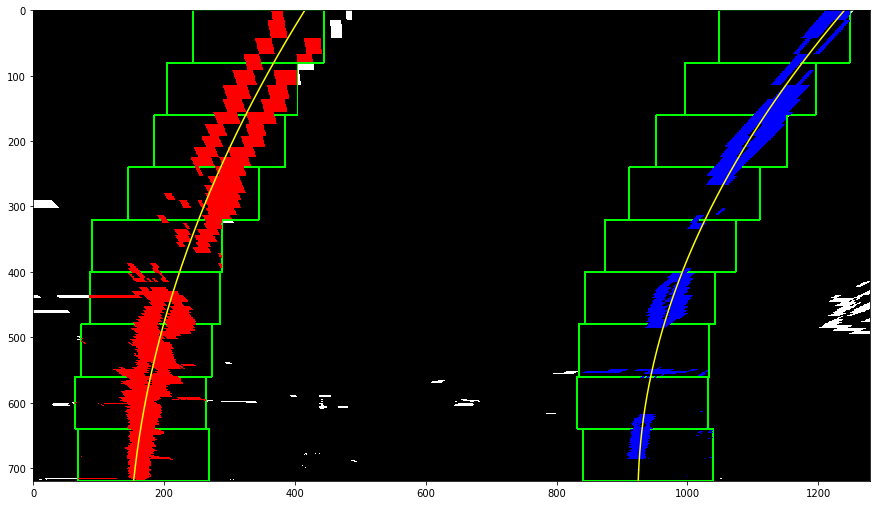

In [19]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/test5.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

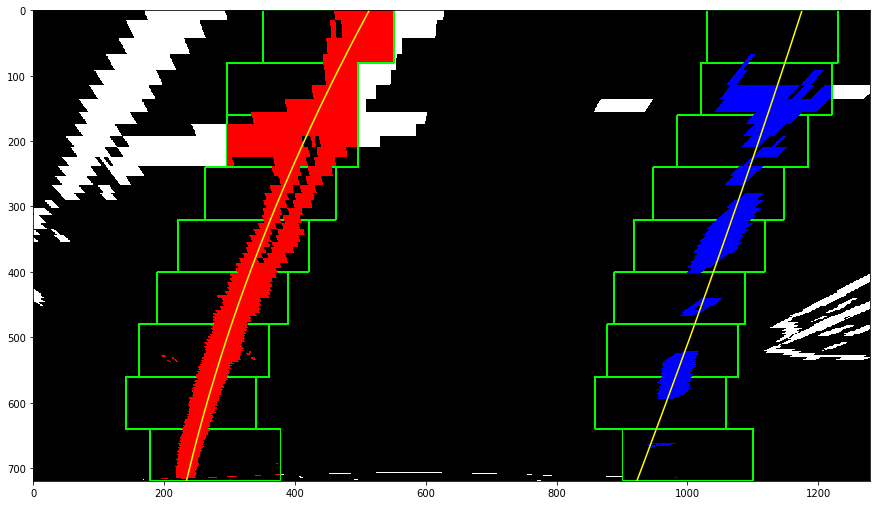

In [20]:
plt.figure(figsize=(15, 15))
img = cv2.imread('./test_images/test6.jpg')
binary_warped = pipeline(mtx, dist, img)
visualize_fit_from_scratch(binary_warped, *fit_curves_from_scratch(binary_warped, show_windows=True))

For the most part, performance is very good -- the fit curves are parallel to each other. Things gets dicey on `./test_images/test1.jpg` and `./test_images/test4.jpg`, which had the hard-to-identify, wide yellow left lanes. But they fit curvesa at least mostly tilt the correct direction.

## 6. Determine the curvature of the lane and vehicle position with respect to center.

Now that the lane lines are known, their curvature and the vehicle position with respect to the lane center can be computed.

In [21]:
# Based on "Project: Advanced Lane Lines, 35. Measuring Curvature".

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# `left_fit` and `right_fit` are the curves fit to the left and right lane lines, respectively.
def compute_curvature_and_offset(left_fit, right_fit):
    # Evaluate for x-values at the bottom edge of the image.
    y_eval = height - 1

    # Convert coefficients of polynomials to real-world scale.
    scaling_factors = [xm_per_pix/ym_per_pix**2, xm_per_pix/ym_per_pix, xm_per_pix]
    left_fit_scaled = left_fit * scaling_factors
    right_fit_scaled = right_fit * scaling_factors
    y_scaled = y_eval * ym_per_pix

    # Calculate the new radii of curvature
    left_curverad = (((1 + (2 * left_fit_scaled[0] * y_scaled + left_fit_scaled[1])**2)**1.5)
                     / np.absolute(2 * left_fit_scaled[0]))
    right_curverad = (((1 + (2 * right_fit_scaled[0] * y_scaled + right_fit_scaled[1])**2)**1.5)
                      / np.absolute(2 * right_fit_scaled[0]))
    
    # Calculate the offset from lane center.
    leftx = (left_fit_scaled[0] * y_scaled**2 + left_fit_scaled[1] * y_scaled + left_fit_scaled[2])
    rightx = (right_fit_scaled[0] * y_scaled**2 + right_fit_scaled[1] * y_scaled + right_fit_scaled[2])
    lane_center = (rightx + leftx) / 2
    # The -(right_margin - left_margin) term is due to shifting the destination rectangle during unwarping.
    image_center = ((width - (right_margin - left_margin))/ 2) * xm_per_pix
    offset = image_center - lane_center

    return left_curverad, right_curverad, offset

for i in [1, 2]:
    binary_warped = pipeline(mtx, dist, cv2.imread('./test_images/straight_lines{}.jpg'.format(i)))
    left_fit, right_fit, _ = fit_curves_from_scratch(binary_warped)
    left_rad, right_rad, offset = compute_curvature_and_offset(left_fit, right_fit)
    print('straight_lines{}.jpg |'.format(i), 'left:', left_rad, 'm, right:', right_rad, 'm, offset:', offset, 'm')

for i in range(1, 7):
    binary_warped = pipeline(mtx, dist, cv2.imread('./test_images/test{}.jpg'.format(i)))
    left_fit, right_fit, _ = fit_curves_from_scratch(binary_warped)
    left_rad, right_rad, offset = compute_curvature_and_offset(left_fit, right_fit)
    print('test{}.jpg |'.format(i), 'left:', left_rad, 'm, right:', right_rad, 'm, offset:', offset, 'm')

straight_lines1.jpg | left: 10558.6110688 m, right: 1769.98545094 m, offset: -3.96681336046e-05 m
straight_lines2.jpg | left: 1652.66641969 m, right: 3235.12873956 m, offset: -0.0419770744637 m
test1.jpg | left: 1477.13093159 m, right: 344.538317633 m, offset: -0.160961577483 m
test2.jpg | left: 290.247889531 m, right: 415.582304104 m, offset: -0.381750802355 m
test3.jpg | left: 403.19599323 m, right: 339.216635807 m, offset: -0.152549649913 m
test4.jpg | left: 1121.8457677 m, right: 345.870007667 m, offset: -0.25753493462 m
test5.jpg | left: 457.206772944 m, right: 288.916582547 m, offset: 0.00439684729967 m
test6.jpg | left: 783.696944886 m, right: 4376.41639117 m, offset: -0.20446752133 m


For the most part, curvatures are in the right ballpark, on the order of 1,000 m. Curvatures for straight lines should be disregarded. The one really questionable value is for the right lane line in `test6.jpg`; it seems that a straight line that slants to the right is what was fit,, hence the particularly high curvature value.

As for offsets from center, examining the original images, in images `straight_lines1.jpg`, `straight_lines2.jpg`, and `test5.jpg`, the lanes are close to centered in the image frame; in images `test1.jpg` and `test3.jpg`, the car is drifting slightly to the left; and in images `test2.jpg`, `test4.jpg`, and `test6.jpg`, the car is drifting pronouncedly to the left. This matches the offsets above.

These values pass sanity-checking.

## 7. Warp the detected lane boundaries back onto the original image.

Finally, I pull everything back together. The image needs to be unwarped back to the original space and annotated with curvature and offset information. I average the left and right lane line curvatures to derive the lane curvature.

In [22]:
# Adapted from "Project: Advanced Lane Finding, 36. Tips and Tricks for the Project"

# `undist` is the distortion-corrected input image.
# `warped` is the binary thresholded and warped image.
# `left_fit` and `right_fit` are the curves fit to the left and right lane lines, resp.
def color_lane_and_unwarp(undist, binary_warped, left_fit, right_fit):
    ploty = np.linspace(0, 719, num=720)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Compute the curves fit to the left and right lanes, to define the lane boundary.
    left_fitx = left_fit[0] * ploty**2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = unwarp_road(color_warp)
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    # Add lane curvature & center offset.
    left_curverad, right_curverad, offset = compute_curvature_and_offset(left_fit, right_fit)
    # Define lane curvature as the average of the left and right lane lines.
    curvature = (left_curverad + right_curverad) / 2
    cv2.putText(result, 'curvature: {}m'.format(round(curvature, 4)), (100, 100),
                cv2.FONT_HERSHEY_SIMPLEX, 2., (255, 255, 255), 2)
    cv2.putText(result, 'position: {}m'.format(round(offset, 4)), (100, 170),
                cv2.FONT_HERSHEY_SIMPLEX, 2., (255, 255, 255), 2)
    return result

Finally, here is the complete process for processing a single image, with sanity-check output.

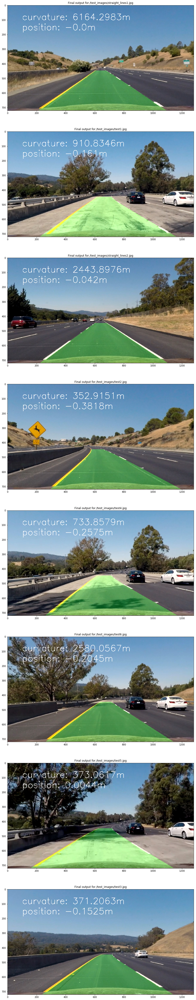

In [23]:
def process_image(img):
    # NOTE: The output you return should be a color image (3 channel) for processing video below.    
    undist = apply_distortion_correction(mtx, dist, img)
    binary_warped = pipeline(mtx, dist, img)
    left_fit, right_fit, _ = fit_curves_from_scratch(binary_warped)
    result = color_lane_and_unwarp(undist, binary_warped, left_fit, right_fit)
    return result

images = glob.glob('./test_images/*.jpg')
plt.figure(figsize=(15, 80))
for i, path in enumerate(images):
    fname = path.split('/')[-1]
    orig_img = cv2.imread(path)
    plt.subplot(len(images), 1, i + 1).set_title('Final output for' + path)
    result = process_image(orig_img)
    cv2.imwrite('./output_images/final/{}'.format(fname), result)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Lastly, I apply all this to the project video.

In [24]:
# From CarND-LaneLines-P1/P1.ipynb

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output = './output_images/project_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
clip = VideoFileClip("./project_video.mp4")
output_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time output_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ./output_images/project_video.mp4
[MoviePy] Writing video ./output_images/project_video.mp4


100%|█████████▉| 1260/1261 [06:33<00:00,  3.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_images/project_video.mp4 

CPU times: user 23min 36s, sys: 28.9 s, total: 24min 5s
Wall time: 6min 34s


In [25]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))